# Comprehensive Data Cleaning and Preprocessing for Machine Learning

**Group:** MarketDay Predictor

**Group Members:**
- Aquiles Escarra
- Angela Lekivetz
- Victoriia Biragova
- Komaljeet Kaur

**Project Goal**

Predict the number of days it will take for a vehicle to sell based on features such as vehicle age, price, and mileage.


## 1. Importing Required Libraries & Loading the Dataset

Import necessary libraries

In [86]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

Load dataset

In [87]:
# Read the dataset into a Pandas DataFrame
df = pd.read_csv('CBB_Listings.csv')

#Setting up notebook so that all columns are displayed
pd.set_option('display.max_columns', None)

Display basic information about the dataset

In [88]:
def dataset_summary(df):
    print("Dataset Summary")
    print("=" * 60)

    # Number of rows and columns
    print(f"Number of Rows: {df.shape[0]}")
    print(f"Number of Columns: {df.shape[1]}")

    print("\nColumn Overview:")
    print("-" * 60)

    # Data types and missing values count
    summary = pd.DataFrame({
        "Data Type": df.dtypes,
        "Missing Values": df.isnull().sum(),
        "Missing %": (df.isnull().sum() / len(df) * 100).round(2)
    })

    # Print the summary
    print(summary)
    print("=" * 60)

# Call the function with your DataFrame
dataset_summary(df)

Dataset Summary
Number of Rows: 145114
Number of Columns: 46

Column Overview:
------------------------------------------------------------
                        Data Type  Missing Values  Missing %
listing_id                 object               0       0.00
listing_heading            object            4015       2.77
listing_type               object               0       0.00
listing_url                object               0       0.00
listing_first_date         object               0       0.00
days_on_market              int64               0       0.00
dealer_id                   int64               0       0.00
dealer_name                object               0       0.00
dealer_street              object               0       0.00
dealer_city                object               0       0.00
dealer_province            object               0       0.00
dealer_postal_code         object               0       0.00
dealer_url                 object               0       0.00
dealer

Visualize the first 5 rows on the dataset

In [89]:
df.head()

,listing_id,listing_heading,listing_type,listing_url,listing_first_date,days_on_market,dealer_id,dealer_name,dealer_street,dealer_city,dealer_province,dealer_postal_code,dealer_url,dealer_email,dealer_phone,dealer_type,stock_type,vehicle_id,vin,uvc,mileage,price,msrp,model_year,make,model,series,style,certified,has_leather,has_navigation,exterior_color,exterior_color_category,interior_color,interior_color_category,price_analysis,wheelbase_from_vin,drivetrain_from_vin,engine_from_vin,transmission_from_vin,fuel_type_from_vin,number_price_changes,price_history_delimited,distance_to_dealer,location_score,listing_dropoff_date
0,f5b663d2-4896-11ef-a15b-8b4423f1ff08,1987 IROC Z 350 Auto T-Tops,Active,https://www.kijiji.ca/v-cars-trucks/edmonton/1...,7/22/2024 0:00,9,11152931,David T's Camaro & Firebird Auto Center,10611 201 St NW,Edmonton,AB,T5S 1Y8,kijiji.ca,NaN,780-454-3330,I,USED,79126,1G1FP2189HN139203,1987160041,230860,11500,0,1987,Chevrolet,Camaro,Iroc Z28,2D Coupe,0,0,0,Blue,blue,NaN,NaN,0,0.0,RWD,5.7L V8 TBI,A,Gas,0,"2024-07-22,11500,230860",9.84,5,NaN
1,a9f565e6-4712-11ef-a23f-79dc25c5e601,NaN,Sold,https://www.redlinemotors.ca/vehicle-details/1...,7/20/2024 0:00,4,11131329,Redlinemotors.Ca,14421 Mark Messier Trail,Edmonton,AB,T6V 1H4,redlinemotors.ca,NaN,780-455-5919,I,USED,72277,1C3BF66P0JW113318,1988180016,48905,8700,0,1988,Chrysler,Fifth Avenue,NaN,4D Sedan,0,0,0,NaN,NaN,NaN,NaN,0,0.0,RWD,5.2L V8,A,Gas,0,"2024-07-20,8700,48905",8.30,5,7/24/2024 0:00
2,03d18c58-253a-11ef-8f33-8905b4a2f000,1989 Cadillac DeVille Sedan FWD,Active,https://www.sweetheartmotor.com/cars/used/1989...,6/7/2024 0:00,54,11161704,Gateway Auto & Rv Sales & Financing Ltd,5404 Gateway Blvd NW,Edmonton,AB,T6H 1B7,sweetheartmotor.com,NaN,780-999-0055,I,USED,66755,1G6CD5157K4364083,1989140008,174640,6000,0,1989,Cadillac,DeVille,NaN,4D Sedan,0,0,0,Pink,pink,NaN,NaN,0,0.0,FWD,4.5L V8 DI,A,Gas,0,"2024-06-07,6000,174640",5.71,4,NaN
3,2d12630b-460e-11ee-89c4-e5b3161d4741,1989 Cadillac DeVille Sedan FWD,Active,https://www.sweetheartmotor.com/cars/used/1989...,8/28/2023 0:00,338,11128265,Credit Angels,5404 Gateway Blvd NW,Edmonton,AB,T6H 1B7,sweetheartmotor.com,NaN,780-244-4999,I,USED,66755,1G6CD5157K4364083,1989140008,174640,6000,0,1989,Cadillac,DeVille,NaN,4D Sedan,0,0,0,Pink,pink,NaN,NaN,0,0.0,FWD,4.5L V8 DI,A,Gas,4,"2023-08-28,4500,174640:2023-09-13,5900,174640:...",5.71,5,NaN
4,53a8e550-47cd-11ef-8587-f926ecb61035,1989 Camaro IROC 350 Auto T-Top,Active,https://www.kijiji.ca/v-cars-trucks/edmonton/1...,7/21/2024 0:00,10,11152931,David T's Camaro & Firebird Auto Center,10611 201 St NW,Edmonton,AB,T5S 1Y8,kijiji.ca,NaN,780-454-3330,I,USED,72366,1G1FP2185K2723911,1989160041,288000,8500,0,1989,Chevrolet,Camaro,Z28,2D Coupe,0,0,0,Other,NaN,NaN,NaN,0,0.0,RWD,5.7L V8 TBI,A,Gas,0,"2024-07-21,8500,288000",9.84,5,NaN


## 2. Mange the data type of columns

This significantly reduces memory usage, especially for columns with a small number of unique values compared to the total number of rows.

In [90]:
# Loop through all columns and convert 'object' type to 'category'
for col in df.select_dtypes(include='object').columns:
    df[col] = df[col].astype('category')

# Verify the changes
print(df.dtypes)

listing_id                 category
listing_heading            category
listing_type               category
listing_url                category
listing_first_date         category
days_on_market                int64
dealer_id                     int64
dealer_name                category
dealer_street              category
dealer_city                category
dealer_province            category
dealer_postal_code         category
dealer_url                 category
dealer_email                float64
dealer_phone               category
dealer_type                category
stock_type                 category
vehicle_id                    int64
vin                        category
uvc                           int64
mileage                       int64
price                         int64
msrp                          int64
model_year                    int64
make                       category
model                      category
series                     category
style                      c

Print statistics data on the numerical columns

In [91]:
df.describe()

,days_on_market,dealer_id,dealer_email,vehicle_id,uvc,mileage,price,msrp,model_year,certified,has_leather,has_navigation,price_analysis,wheelbase_from_vin,number_price_changes,distance_to_dealer,location_score
count,145114.000000,1.451140e+05,0.0,145114.000000,1.451140e+05,1.451140e+05,1.451140e+05,145114.000000,145114.000000,145114.000000,145114.0,145114.0,145114.000000,145114.000000,145114.000000,145114.000000,145114.000000
mean,47.810218,1.115641e+07,NaN,513749.054006,2.021818e+09,4.598501e+04,4.786611e+04,51247.428229,2021.361157,0.006602,0.0,0.0,0.082928,3026.472990,3.504782,9.436435,3.010984
std,57.862393,4.389865e+04,NaN,94034.105057,3.557037e+06,6.227304e+04,9.070245e+04,21760.734381,3.542539,0.080983,0.0,0.0,0.275774,559.718857,7.765742,6.226795,2.104691
min,1.000000,1.112677e+07,NaN,66737.000000,1.987160e+09,0.000000e+00,0.000000e+00,0.000000,1987.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,1.230000,0.000000
25%,14.000000,1.112884e+07,NaN,480906.000000,2.020161e+09,1.500000e+01,2.699000e+04,35149.000000,2020.000000,0.000000,0.0,0.0,0.000000,2700.000000,0.000000,6.090000,1.000000
50%,26.000000,1.113164e+07,NaN,558583.000000,2.023360e+09,9.650000e+03,4.190000e+04,48035.000000,2023.000000,0.000000,0.0,0.0,0.000000,2850.000000,1.000000,7.420000,4.000000
75%,59.000000,1.116104e+07,NaN,580271.000000,2.024340e+09,8.011900e+04,6.277025e+04,63045.000000,2024.000000,0.000000,0.0,0.0,0.000000,3342.000000,3.000000,9.400000,5.000000
max,367.000000,1.125746e+07,NaN,599912.000000,2.024960e+09,1.000008e+06,1.309532e+07,315100.000000,2024.000000,1.000000,0.0,0.0,1.000000,5014.000000,154.000000,29.660000,5.000000


## 3. Handling duplicated Values

Number of rows before cleaning duplicate values

In [92]:
print(f"Number of rows before cleaning: {df.shape[0]}")

Number of rows before cleaning: 145114


In [93]:
# Count the number of fully duplicated rows in the dataset
num_duplicates = df.duplicated(subset=['vin', 'mileage'],keep='last').sum()

# Display the number of fully duplicated rows
print(f"Number of fully duplicated rows (same vin and mileage): {num_duplicates}")

Number of fully duplicated rows (same vin and mileage): 35585


In [94]:
df_grouped = df.groupby(["vin", "mileage"], observed=True).size().reset_index(name="count")

# Filter the gropus where the quantity is greater than 1
df_filtered = df_grouped[df_grouped["count"] > 1].sort_values("count", ascending=False)

# Show the result
df_filtered.head(10)

,vin,mileage,count
89423,JN8BT3DD1PW315979,2010,11
81292,5YFBPRBE8LP035798,53548,9
78510,5TFLA5DA7NX004250,34655,9
89220,JN8BT3CB1RW421481,15,9
64034,3MZBN1V71JM250705,77377,9
92634,KL8CD6SA5KC780131,42017,9
18268,1FT8W3BT0LEE39877,86745,8
78277,5TFDZ5BN0KX041834,222176,7
78313,5TFDZ5BN2KX040359,139487,7
15326,1FMCU9H94JUC93352,165704,7


Print a case to analize the table

In [95]:
df.loc[df["vin"] == "JN8BT3CB1RW421481",
       ["listing_type", "listing_first_date", "days_on_market", "dealer_id",
        "stock_type", "vin", "mileage", "price","msrp", "model_year", "make",
        "model", "price_history_delimited", "number_price_changes"]
      ].sort_values("listing_first_date", ascending=True)


,listing_type,listing_first_date,days_on_market,dealer_id,stock_type,vin,mileage,price,msrp,model_year,make,model,price_history_delimited,number_price_changes
131472,Sold,3/15/2024 0:00,104,11129022,NEW,JN8BT3CB1RW421481,15,46999,42698,2024,Nissan,Rogue,"2024-03-15,45523,15:2024-03-19,46272,15:2024-0...",2
132062,Sold,6/15/2024 0:00,28,11131641,NEW,JN8BT3CB1RW421481,15,0,42698,2024,Nissan,Rogue,"2024-06-15,46272,15:2024-06-18,46999,15:2024-0...",2
131705,Sold,6/16/2024 0:00,28,11130797,NEW,JN8BT3CB1RW421481,15,46999,42698,2024,Nissan,Rogue,"2024-06-16,46272,15:2024-06-18,46999,15:2024-0...",3
132357,Sold,6/16/2024 0:00,19,11129839,NEW,JN8BT3CB1RW421481,15,46999,42698,2024,Nissan,Rogue,"2024-06-16,46272,15:2024-06-18,46999,15",1
132181,Sold,7/10/2024 0:00,16,11129023,NEW,JN8BT3CB1RW421481,15,45123,42698,2024,Nissan,Rogue,"2024-07-10,0,15:2024-07-13,46999,15:2024-07-21...",2
132356,Sold,7/6/2024 0:00,4,11129839,USED,JN8BT3CB1RW421481,15,46999,42698,2024,Nissan,Rogue,"2024-07-06,46999,15",0
131704,Sold,7/8/2024 0:00,8,11130797,USED,JN8BT3CB1RW421481,15,46999,42698,2024,Nissan,Rogue,"2024-07-08,46999,15",0
132081,Sold,7/8/2024 0:00,2,11131641,USED,JN8BT3CB1RW421481,15,46999,42698,2024,Nissan,Rogue,"2024-07-08,46999,15",0
132182,Active,7/8/2024 0:00,23,11129023,USED,JN8BT3CB1RW421481,15,45123,42698,2024,Nissan,Rogue,"2024-07-08,46999,15:2024-07-22,45123,15:2024-0...",3


**Database cleaned, no duplicated cars and saving the lowest number of days in each case**

In [96]:
df['model_year'].unique()

array([1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997,
       1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008,
       2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019,
       2020, 2021, 2022, 2023, 2024])

In [97]:
# Keep only the record with the lowest "days_on_market" per unique VIN and mileage
df= df.loc[df.groupby(["vin", "mileage"], observed=True)["days_on_market"].idxmin()].reset_index(drop=True)

# Print the number of records after cleaning
print(f"Records after cleaning: {len(df):,}")

Records after cleaning: 109,529


### Handling missing values in categorical columns with meaningful information

Columns considered: 'exterior_color', 'exterior_color_category', 'interior_color', 'interior_color_category'

Note:
'listing_heading' and 'dealer_phone' will not be considered because those columns do not have meaningfull information in our model.

In [98]:
# Replace missing values in 'exterior_color' column with its mode
mode_value = df['exterior_color'].mode()[0]  # Calculate the mode
df.loc[:,'exterior_color'] = df['exterior_color'].fillna(mode_value)  # Replace missing values with the mode

# Replace missing values in 'eexterior_color_category' column with its mode
mode_value = df['exterior_color_category'].mode()[0]  # Calculate the mode
df.loc[:,'exterior_color_category'] = df['exterior_color_category'].fillna(mode_value)  # Replace missing values with the mode

# Replace missing values in 'interior_color' column with its mode
mode_value = df['interior_color'].mode()[0]  # Calculate the mode
df.loc[:,'interior_color'] = df['interior_color'].fillna(mode_value)  # Replace missing values with the mode

# Replace missing values in 'interior_color_categoryr' column with its mode
mode_value = df['interior_color_category'].mode()[0]  # Calculate the mode
df.loc[:, 'interior_color_category'] = df['interior_color_category'].fillna(mode_value)  # Replace missing values with the mode


### Handling Categorical misspeling problems

Feature transmission_from_vin

In [99]:
df['transmission_from_vin'].unique()

['A', 'M', '7', '6']
Categories (4, object): ['6', '7', 'A', 'M']

In [100]:
# Convert the column to string type to perform the replacement
df['transmission_from_vin'] = df['transmission_from_vin'].astype(str)

# Replace the values
df['transmission_from_vin'] = df['transmission_from_vin'].replace({"6": 'M', "7": 'A'})

# Convert the column back to categorical type
df['transmission_from_vin'] = df['transmission_from_vin'].astype('category')

In [101]:
df['transmission_from_vin'].unique()

['A', 'M']
Categories (2, object): ['A', 'M']

## 4. Basic Graphics analysis

Create a new dataset with the columns drooping the columns that are not related with the hipotesis or do not have relevant information.

In [102]:
df = df[[#'listing_id', 'listing_heading',
             'listing_type', #'listing_url',
             'listing_first_date', 'days_on_market', #'dealer_id',
             'dealer_name',#'dealer_street',
             'dealer_city', #'dealer_province', 'dealer_postal_code',
              #'dealer_url', 'dealer_email', 'dealer_phone', 'dealer_type',
              'stock_type', #'vehicle_id', 'vin', 'uvc',
              'mileage', 'price', 'msrp',
              'model_year', 'make', 'model', 'series', 'style', #'certified',
              #'has_leather', 'has_navigation',
              #'exterior_color',
              'exterior_color_category', #'interior_color',
              'interior_color_category',
              'price_analysis', 'wheelbase_from_vin', 'drivetrain_from_vin',
              'engine_from_vin', 'transmission_from_vin', 'fuel_type_from_vin',
              'number_price_changes', #'price_history_delimited', 'distance_to_dealer',
              'location_score'#, 'listing_dropoff_date'
             ]].copy()

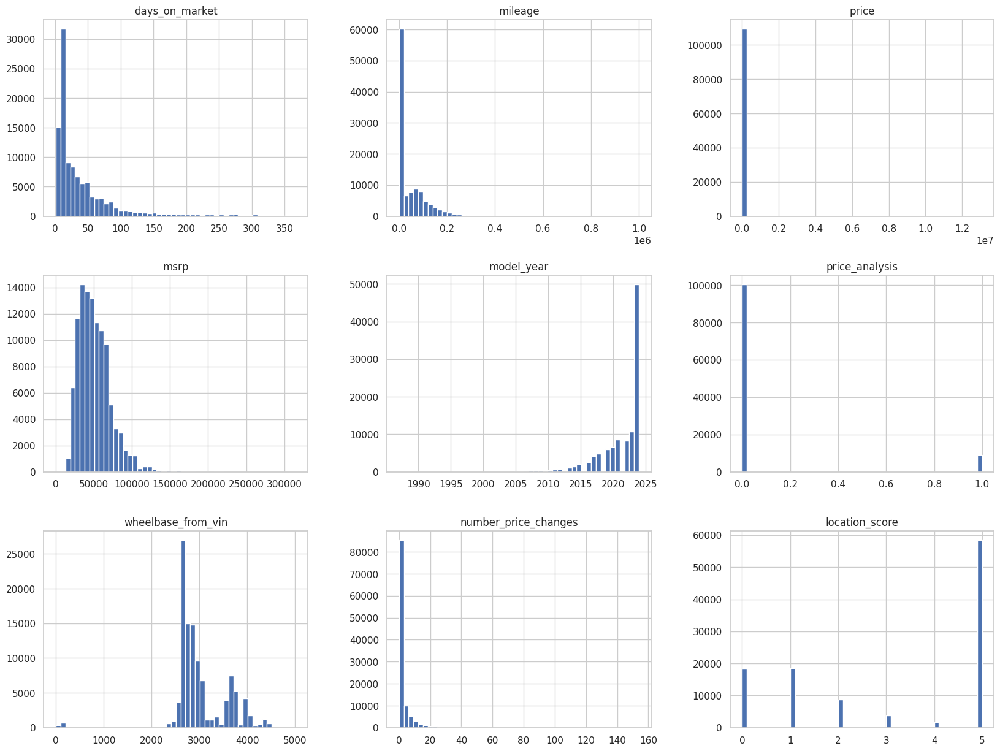

In [103]:
df.hist(bins=50, figsize=(20, 15))
plt.show()

Horizontal boxplot of price

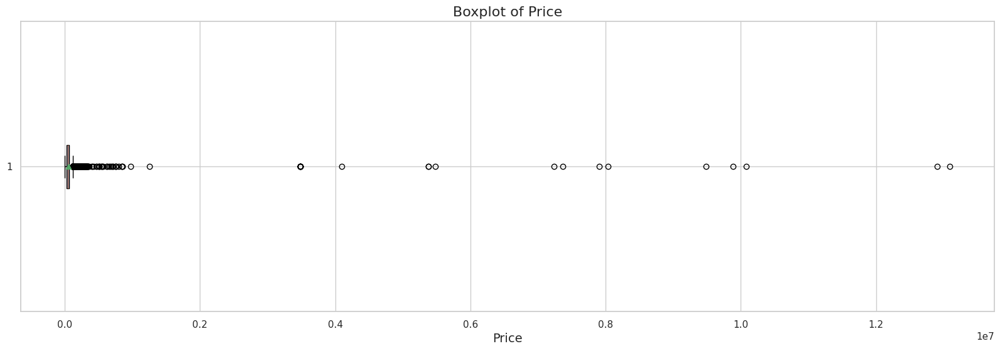

In [104]:
# Build a boxplot to identify outliers for the 'price' column
plt.figure(figsize=(20, 6))
plt.boxplot(df['price'][df['price'] > 0], vert=False, patch_artist=True, showmeans=True)
plt.title('Boxplot of Price', fontsize=16)
plt.xlabel('Price', fontsize=14)
plt.show()

Horizontal boxplot of days on market

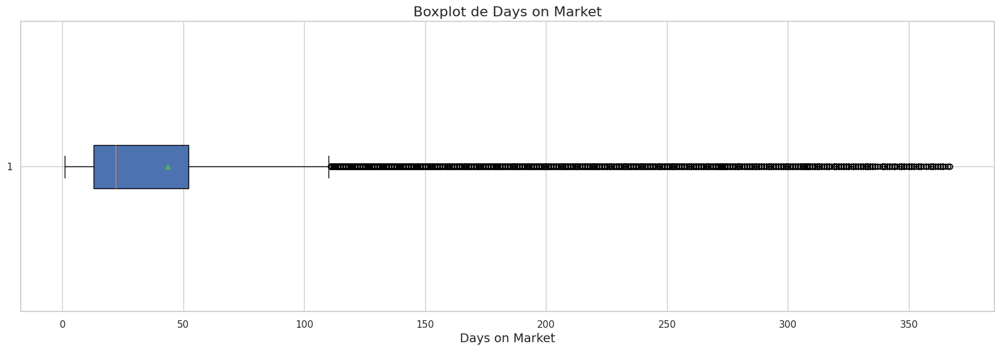

In [105]:
# Build a boxplot to identify outliers on Days on Market
plt.figure(figsize=(20, 6))
plt.boxplot(df['days_on_market'], vert=False, patch_artist=True, showmeans=True)
plt.title('Boxplot de Days on Market', fontsize=16)
plt.xlabel('Days on Market', fontsize=14)
plt.show()

Horizontal boxplot of mileage

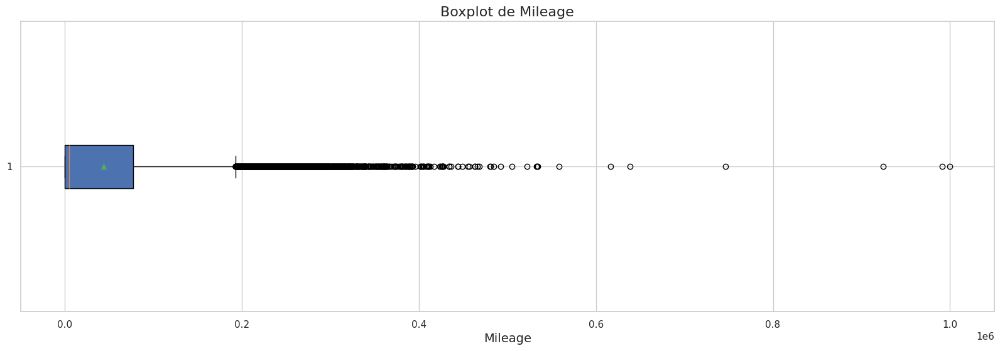

In [106]:
 # Build a boxplot to identify outliers on Mileage
plt.figure(figsize=(20, 6))
plt.boxplot(df['mileage'], vert=False, patch_artist=True, showmeans=True)
plt.title('Boxplot de Mileage', fontsize=16)
plt.xlabel('Mileage', fontsize=14)
plt.show()

Distribution of the Target Variable (days_on_market)

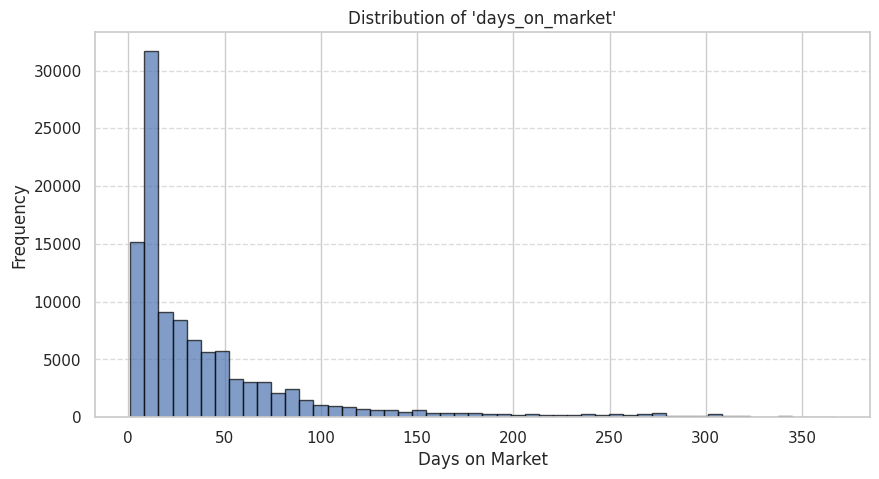

In [107]:
plt.figure(figsize=(10, 5))
plt.hist(df["days_on_market"], bins=50, edgecolor="black", alpha=0.7)
plt.title("Distribution of 'days_on_market'")
plt.xlabel("Days on Market")
plt.ylabel("Frequency")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

Relationship Between Mileage & Price

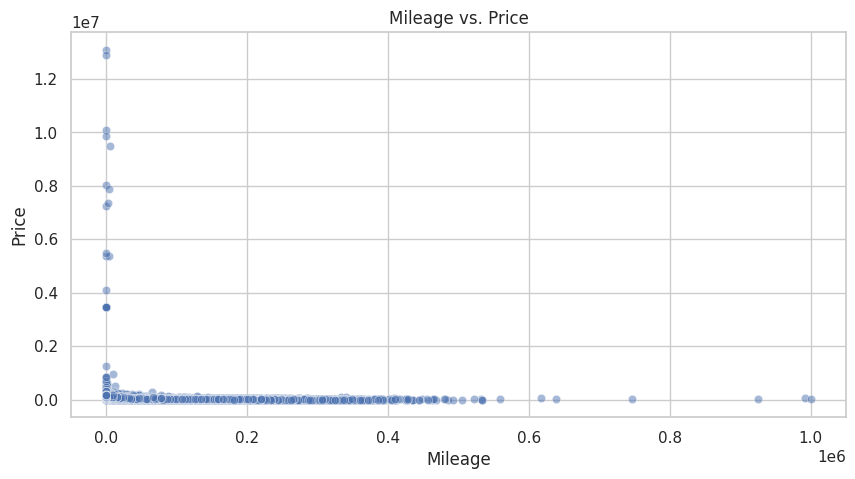

In [108]:
plt.figure(figsize=(10, 5))
sns.scatterplot(x=df["mileage"], y=df["price"], alpha=0.5)
plt.title("Mileage vs. Price")
plt.xlabel("Mileage")
plt.ylabel("Price")
plt.show()

Price Variation by Car Make

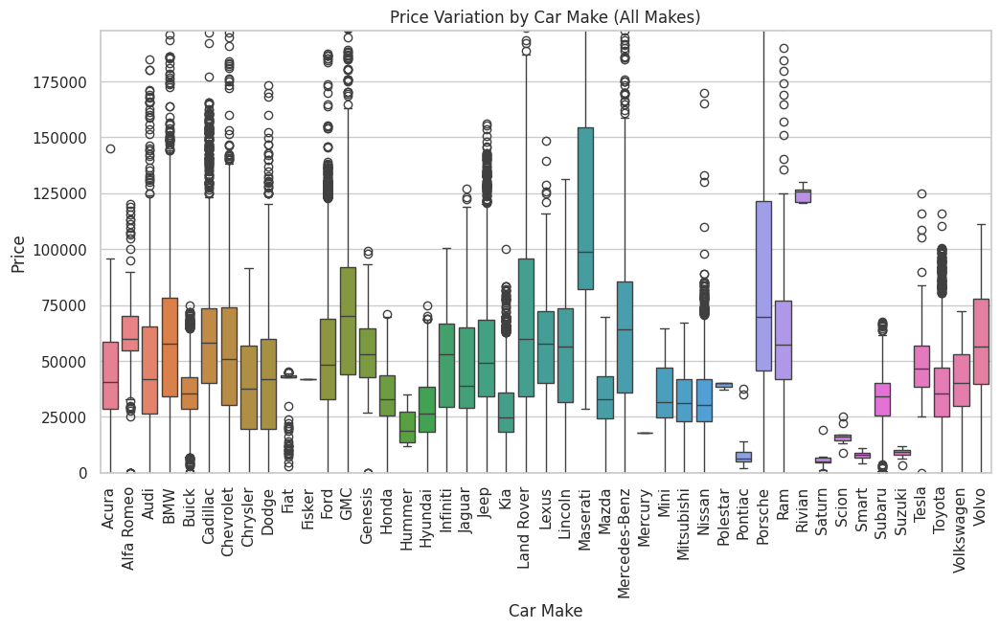

In [109]:
# Price Variation by Car Make
plt.figure(figsize=(12, 6))

# Get all unique car makes (since there are only 45)
unique_makes = df["make"].unique()

# Filter the DataFrame to include all makes
df_filtered = df[df["make"].isin(unique_makes)]  # Ensure all makes are included

# Create the boxplot using `hue` instead of `palette`
sns.boxplot(
    data=df_filtered, x="make", y="price", hue="make", dodge=False, legend=False
)

# Customize the plot
plt.xticks(rotation=90)  # Rotate more for better readability if there are many makes
plt.title("Price Variation by Car Make (All Makes)")
plt.xlabel("Car Make")
plt.ylabel("Price")
plt.ylim(0, df["price"].quantile(0.95) * 2)  # Adjust outlier limit for better visualization
plt.show()

Comparison between MSRP and Listed Price

In [110]:
import plotly.express as px

# Generate a single interactive scatter plot for MSRP vs. Listed Price using Plotly
fig1 = px.scatter(
    df,
    x="msrp",
    y="price",
    color="stock_type",
    color_discrete_map={"NEW": "blue", "USED": "red"},
    hover_data=["make", "model", "model_year"],
    title="MSRP vs. Listed Price (Interactive Plot)",
    labels={"msrp": "MSRP (Market Price)", "price": "Listed Price"},
    opacity=0.6)
fig1.show()

Create two subplots for the different price ranges based on the "Comparison between MSRP and Listed Price" analisys

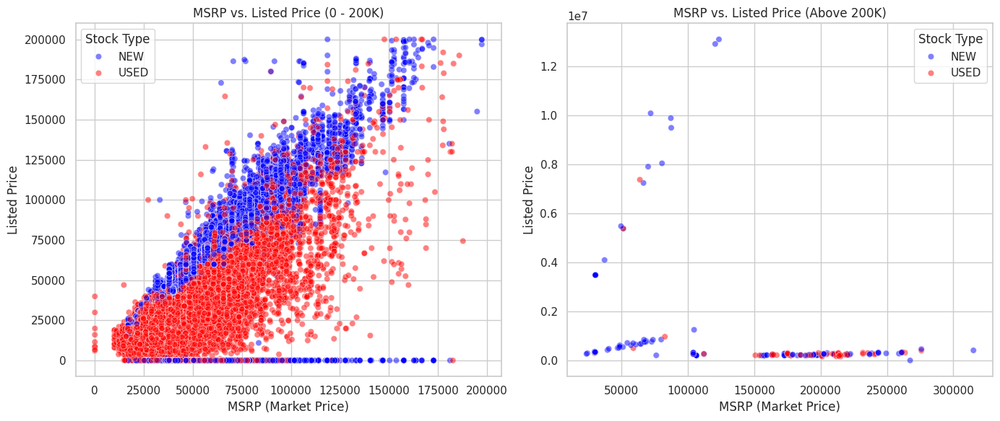

In [111]:
# Define the filtering conditions
df_below_200k = df[(df["msrp"] <= 200000) & (df["price"] <= 200000)]
df_above_200k = df[(df["msrp"] > 200000) | (df["price"] > 200000)]

# Create two subplots for the different price ranges
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Scatter plot for MSRP vs. Price (Below 200K)
sns.scatterplot(
    x=df_below_200k["msrp"],
    y=df_below_200k["price"],
    hue=df_below_200k["stock_type"],
    palette={"NEW": "blue", "USED": "red"},
    alpha=0.5,
    ax=axes[0]
)
axes[0].set_title("MSRP vs. Listed Price (0 - 200K)")
axes[0].set_xlabel("MSRP (Market Price)")
axes[0].set_ylabel("Listed Price")
axes[0].legend(title="Stock Type")

# Scatter plot for MSRP vs. Price (Above 200K)
sns.scatterplot(
    x=df_above_200k["msrp"],
    y=df_above_200k["price"],
    hue=df_above_200k["stock_type"],
    palette={"NEW": "blue", "USED": "red"},
    alpha=0.5,
    ax=axes[1]
)
axes[1].set_title("MSRP vs. Listed Price (Above 200K)")
axes[1].set_xlabel("MSRP (Market Price)")
axes[1].set_ylabel("Listed Price")
axes[1].legend(title="Stock Type")

# Adjust layout and display plots
plt.tight_layout()
plt.show()

Cars with Listed Price equal "cero"

In [112]:
# Calculate the number of vehicles with prize equal zero
count_zero = (df['price'] == 0).sum()

print(f"The quatity of vehicles with price equal cero is: {count_zero}")

The quatity of vehicles with price equal cero is: 3566


Cars with Market Price equal "cero"

In [113]:
# Calculate the number of vehicles with market prize equal zero
count_zero_msrp = (df['msrp'] == 0).sum()

print(f"The quatity of vehicles with market price equal cero is: {count_zero_msrp}")

The quatity of vehicles with market price equal cero is: 9


Apply IQR Method on numeric columns to analize boundaries and posible outliers

In [114]:
for column in df.select_dtypes(include='number').columns:
    # Calculate quartiles and interquartile range (IQR) for 'price'
    Q1 = df[column].quantile(0.25)  # First quartile (25%)
    Q3 = df[column].quantile(0.75)  # Third quartile (75%)
    IQR = Q3 - Q1  # Interquartile range

    # Define boundaries to identify outliers
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Filter outliers
    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    print(column)
    print('upper bound:',upper_bound)
    print('lower bound:',lower_bound)
    print(f"Outliers in {column}: {len(outliers)}\n")


days_on_market
upper bound: 110.5
lower bound: -45.5
Outliers in days_on_market: 9667

mileage
upper bound: 192917.5
lower bound: -115726.5
Outliers in mileage: 3348

price
upper bound: 116083.0
lower bound: -26245.0
Outliers in price: 2455

msrp
upper bound: 104487.5
lower bound: -6412.5
Outliers in msrp: 2340

model_year
upper bound: 2030.0
lower bound: 2014.0
Outliers in model_year: 4046

price_analysis
upper bound: 0.0
lower bound: 0.0
Outliers in price_analysis: 9228

wheelbase_from_vin
upper bound: 4295.0
lower bound: 1743.0
Outliers in wheelbase_from_vin: 3009

number_price_changes
upper bound: 7.5
lower bound: -4.5
Outliers in number_price_changes: 12203

location_score
upper bound: 11.0
lower bound: -5.0
Outliers in location_score: 0



From the graphs and the boundaries we deside to analize outliers case by case.

## 5. Handling Outliers

### Model year

In [115]:
np.sort(df['model_year'].unique())

array([1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997,
       1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008,
       2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019,
       2020, 2021, 2022, 2023, 2024])

After analyzing the year data, we conclude that there are no outliers in the model_year feature.

### Wheelbase_from_vin

Print statistics for wheelbase feature

In [116]:
df['wheelbase_from_vin'].describe()

,wheelbase_from_vin
count,109529.000000
mean,3022.568679
std,554.521765
min,0.000000
25%,2700.000000
50%,2849.000000
75%,3338.000000
max,5014.000000


In [117]:
# Calculate the number of vehicles with market prize equal zero
count_zero_wheelbase_from_vin = (df['wheelbase_from_vin'] == 0).sum()

print(f"The quatity of vehicles with wheelbase_from_vin equal cero is: {count_zero_wheelbase_from_vin}")

The quatity of vehicles with wheelbase_from_vin equal cero is: 312


In [118]:
import numpy as np
import pandas as pd

def impute_wheelbase_outliers(df):
    """
    Imputes outliers and zero values in 'wheelbase_from_vin' with the median of the entire dataset.
    """
    # Ensure 'wheelbase_from_vin' is numeric and convert non-numeric values to NaN
    df['wheelbase_from_vin'] = pd.to_numeric(df['wheelbase_from_vin'], errors='coerce')

    # Calculate Q1, Q3, IQR, and bounds for the entire dataset
    Q1 = df['wheelbase_from_vin'].quantile(0.25)
    Q3 = df['wheelbase_from_vin'].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Calculate the global median
    global_median = df['wheelbase_from_vin'].median()

    # Impute outliers and zero values with the global median
    df['wheelbase_from_vin'] = np.where(
        (df['wheelbase_from_vin'] < lower_bound) |
        (df['wheelbase_from_vin'] > upper_bound) |
        (df['wheelbase_from_vin'] == 0),
        global_median,
        df['wheelbase_from_vin']
    )

    return df

In [119]:
# Impute wheelbase outliers
df = impute_wheelbase_outliers(df)

In [120]:
# Calculate the number of vehicles with market prize equal zero
count_zero_wheelbase_from_vin = (df['wheelbase_from_vin'] == 0).sum()

print(f"The quatity of vehicles with wheelbase_from_vin equal cero is: {count_zero_wheelbase_from_vin}")

The quatity of vehicles with wheelbase_from_vin equal cero is: 0


In [121]:
df['wheelbase_from_vin'].describe()

,wheelbase_from_vin
count,109529.000000
mean,3020.931592
std,439.055748
min,1867.000000
25%,2700.000000
50%,2849.000000
75%,3178.000000
max,4293.000000


### Mileage

In [122]:
#finding mileage outliers by grouping model_year
for year, group in df.groupby('model_year'):
        df['mileage'] = df['mileage'].astype(float)

        # Compute Q1 (25th percentile) and Q3 (75th percentile)
        Q1 = np.percentile(group['mileage'], 25)
        Q3 = np.percentile(group['mileage'], 75)

        # Compute Interquartile Range (IQR)
        IQR = Q3 - Q1

        # Define lower and upper bounds for outliers
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Compute mmedian mileage for the model year (excluding outliers)
        median_mileage = group[(group['mileage'] >= lower_bound) & (group['mileage'] <= upper_bound)]['mileage'].median()

        # Replace outliers with the median mileage of their respective model year
        df.loc[(df['model_year'] == year) & ((df['mileage'] < lower_bound) | (df['mileage'] > upper_bound)), 'mileage'] = median_mileage

### Price

**Based on the analysis from the MSRP vs. Listed Price comparison, we will proceed with two critical imputations:**  

Flagging Vehicles with MSRP<150K but Listed_Price>250K
- These are likely data entry errors or unusual pricing situations.
- We will create a new column (price_flagged) to mark these records for further review.

Flagging Vehicles with a Listed Price of 0
- A vehicle's listed price should never be 0, so this is either missing or incorrect data.

Use a single imputation process to replace these values with:
- The way we handle this is by imputing the missing values with the median price of: **The same brand (make), The same model (model), The same model year (model_year)**. If there’s not enough data in a small segment, we will fall back to the median of the brand.
- Store imputed values in the same price_imputed column.

Flagging vehicles where MSRP < 150K but Listed Price > 250K

In [123]:
df["price_flagged"] = (
    ((df["msrp"] < 150000) & (df["price"] > 250000)) |  # Overpriced vehicles
    (df["price"] < 2000) |  # Extremely low price
    ((df["model_year"].isin([2023, 2024])) & (df["price"] < df["msrp"]))  # 2023-2024 below MSRP
).astype(int)

Create a new column 'price_imputed' as a copy of 'price' to preserve original values

In [124]:
df["price_imputed"] = df["price"].copy()

Define function to impute outlier prices using segment median

In [125]:
def impute_price_segmented(data):
    """Impute outlier prices using median within different levels, ensuring at least 3 vehicles per group."""

    # Compute median within each segment, ensuring groups have more than 3 vehicles
    grouped_median_full = data[data["price"] > 1000].groupby(["make", "model", "model_year"], observed=True).filter(lambda x: len(x) > 3).groupby(["make", "model", "model_year"], observed=True)["price"].median()

    grouped_median_model = data[data["price"] > 1000].groupby(["make", "model"], observed=True).filter(lambda x: len(x) > 3).groupby(["make", "model"], observed=True)["price"].median()

    grouped_median_make = data[data["price"] > 1000].groupby("make", observed=True).filter(lambda x: len(x) > 3).groupby("make", observed=True)["price"].median()

    # Compute overall median price as the last fallback
    overall_median = data[data["price"] > 0]["price"].median()

    # Apply median by segment
    def fill_price(row):
        if row["price_flagged"] == 1:  # Only replace outliers and flagged prices
            key_full = (row["make"], row["model"], row["model_year"])
            key_model = (row["make"], row["model"])
            key_make = row["make"]

            if key_full in grouped_median_full and grouped_median_full[key_full] > 0:
                return grouped_median_full[key_full]  # Use full match if valid
            elif key_model in grouped_median_model and grouped_median_model[key_model] > 0:
                return grouped_median_model[key_model]  # Use model-level median if valid
            elif key_make in grouped_median_make and grouped_median_make[key_make] > 0:
                return grouped_median_make[key_make]  # Use brand-level median if valid
            else:
                return overall_median  # Use overall median as the last fallback
        return row["price_imputed"]  # Keep original value if not flagged

    data["price_imputed"] = data.apply(fill_price, axis=1)
    return data

Apply the imputation function

In [126]:
df = impute_price_segmented(df).copy()

Verify changes by summarizing the imputed prices

In [127]:
df[["price", "price_imputed"]].describe()

,price,price_imputed
count,1.095290e+05,109529.000000
mean,4.828256e+04,49104.624392
std,1.029531e+05,27209.279272
min,0.000000e+00,2000.000000
25%,2.712800e+04,28999.000000
50%,4.192500e+04,43492.000000
75%,6.271000e+04,64765.000000
max,1.309532e+07,460672.000000


In [128]:
df.loc[df["price_imputed"]<3000]

,listing_type,listing_first_date,days_on_market,dealer_name,dealer_city,stock_type,mileage,price,msrp,model_year,make,model,series,style,exterior_color_category,interior_color_category,price_analysis,wheelbase_from_vin,drivetrain_from_vin,engine_from_vin,transmission_from_vin,fuel_type_from_vin,number_price_changes,location_score,price_flagged,price_imputed
424,Sold,7/12/2024 0:00,3,Autocanada,Edmonton,USED,217136.0,2500,23995,2012,Chrysler,200,Touring,4D Sedan,red,black,0,2765.0,FWD,3.6L V6 SMPI DOHC VVT,A,Gas,0,3,0,2500.0
427,Sold,5/8/2024 0:00,11,Canada One Auto Group,Edmonton,USED,170186.0,2900,23995,2012,Chrysler,200,Touring,4D Sedan,black,black,0,2765.0,FWD,3.6L V6 SMPI DOHC VVT,A,Gas,2,1,0,2900.0
531,Sold,7/10/2024 0:00,2,Autocanada,Edmonton,USED,222227.0,2995,25945,2008,Chrysler,Sebring,Touring,4D Sedan,blue,black,0,2849.0,FWD,3.5L V6 MPI HO,A,Gas,0,2,0,2995.0
1388,Active,7/20/2024 0:00,11,Canada One Auto Group,Edmonton,USED,153098.0,2500,21195,2012,Jeep,Compass,Sport,4D Utility 4WD,white,brown,0,2635.0,4WD,2.4L I-4 SMPI DOHC VVT,A,Gas,1,1,0,2500.0
12689,Active,7/21/2024 0:00,10,Canada One Auto Group,Edmonton,USED,174067.0,2900,32395,2008,Dodge,Nitro,R/T,4D Utility 4WD,black,black,0,2849.0,4WD,4.0L V6 SFI,A,Gas,0,2,0,2900.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98592,Sold,4/20/2024 0:00,11,Norden Volkswagen,Edmonton,USED,180296.0,1486,22375,2006,Kia,Spectra5,EX Sport,4D Hatchback,white,black,0,2849.0,FWD,2.0L I-4 EFI DOHC,A,Gas,0,0,1,2750.0
98596,Sold,4/28/2024 0:00,1,Autocanada,Edmonton,USED,153429.0,2997,22395,2009,Kia,Rondo,EX,4D Wagon,white,black,1,2700.0,FWD,2.4L I-4 MPI DOHC,A,Gas,0,0,0,2997.0
99801,Sold,4/25/2024 0:00,41,Autocanada,Edmonton,USED,241200.0,2997,18595,2011,Kia,Soul,2.0L 2u,4D Hatchback 5sp,white,black,1,2550.0,FWD,2.0L I-4 MPI DOHC,M,Gas,1,1,0,2997.0
101558,Sold,4/28/2024 0:00,41,Autocanada,Edmonton,USED,210435.0,2597,44995,2004,Jaguar,X-Type,NaN,4D Sedan 3.0,white,black,0,2849.0,AWD,3.0L V6 EFI,A,Gas,1,2,0,2597.0


## 6. Segmentation of data

In [129]:
# Define a dictionary to classify brands as "Luxury" and "Economic"
luxury_brands = {"Acura", "Alfa Romeo", "Audi", "BMW", "Cadillac", "Genesis", "Infiniti", "Jaguar",
                 "Land Rover", "Lexus", "Lincoln", "Maserati", "Mercedes-Benz", "Porsche", "Tesla", "Volvo"}

# Create a new column with the classification
df["segment"] = df["make"].apply(
    lambda x: "Luxury" if x in luxury_brands else "Economic"
)

count_luxury = df[df["segment"] == "Luxury"].shape[0]
count_economic = df[df["segment"] == "Economic"].shape[0]

# Print formatted output
print(f"Total number of luxury cars: {count_luxury:,}")
print(f"Total number of Economic cars: {count_economic:,}")

Total number of luxury cars: 13,738
Total number of Economic cars: 95,791


In [130]:
# Filter new and used cars
df_new = df[df["stock_type"] == "NEW"]
df_used = df[df["stock_type"] == "USED"]

# Count the number of new and used cars
count_new = df_new.shape[0]
count_used = df_used.shape[0]

# Print formatted output
print(f"Total number of new cars: {count_new:,}")
print(f"Total number of used cars: {count_used:,}")

Total number of new cars: 53,386
Total number of used cars: 56,143


In [131]:
# Count the number of new and used cars by segmentation
count_new_luxury = df_new[df_new["segment"] == "Luxury"].shape[0]
count_new_economic = df_new[df_new["segment"] == "Economic"].shape[0]

count_used_luxury = df_used[df_used["segment"] == "Luxury"].shape[0]
count_used_economic = df_used[df_used["segment"] == "Economic"].shape[0]

# Print formatted output
print(f"New Luxury cars: {count_new_luxury:,}")
print(f"New Economic cars: {count_new_economic:,}")
print(f"Used Luxury cars: {count_used_luxury:,}")
print(f"Used Economic cars: {count_used_economic:,}")

New Luxury cars: 5,491
New Economic cars: 47,895
Used Luxury cars: 8,247
Used Economic cars: 47,896


In [132]:
df.shape

(109529, 27)

In [133]:
from google.colab import files

df.to_csv('Go_auto_cleaned_vf.csv', index=False)

# Download the cleaned file
files.download('Go_auto_cleaned_vf.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## 7.Graphic final Analisys

Create a cleaned dataframe backup

In [134]:
df_clean = df.copy()

Selecting sold vehicles for further analysis

In [135]:
df = df.loc[df['listing_type']=='Sold'].copy()

In [136]:
print('Number of sold vehicles:',df.shape[0])

Number of sold vehicles: 71641


In [137]:
# Create a new column to differentiate outliers in color mapping
df["color_group"] = df.apply(lambda row: "Outlier" if row["price_flagged"] == 1 else row["stock_type"], axis=1)

# Generate an interactive scatter plot with a new color for outliers
fig_price_imputed = px.scatter(
    df,
    x="msrp",
    y="price_imputed",
    color="color_group",  # Use the new column
    color_discrete_map={"NEW": "blue", "USED": "red", "Outlier": "green"},  # Define colors
    hover_data=["price", "make", "model", "model_year", "mileage"],
    title="MSRP vs. Listed Price (Interactive Plot) - Sold vehicles",
    labels={"msrp": "MSRP (Market Price)", "price_imputed": "price_imputed"},
    opacity=0.6
)

# Show the plot
fig_price_imputed.show()

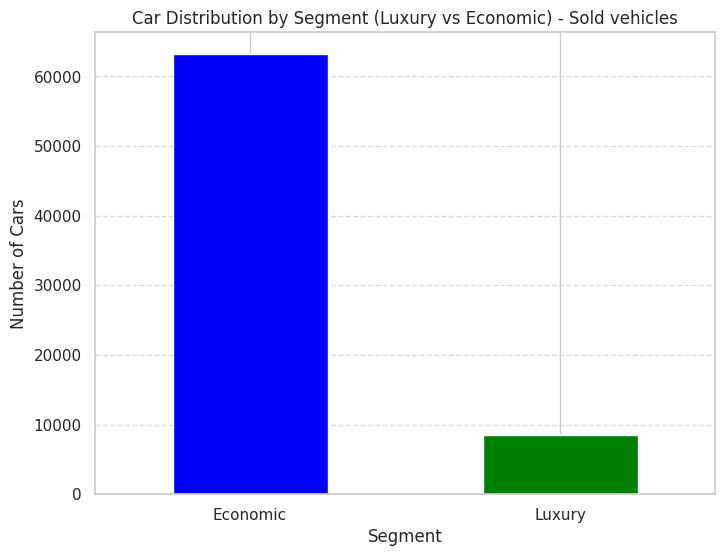

,count
segment,
Economic,63188
Luxury,8453


In [138]:
# Display the number of cars in each segment
segment_counts = df["segment"].value_counts()

# Visualize the distribution of segments
plt.figure(figsize=(8,6))
segment_counts.plot(kind="bar", color=["blue", "green"])
plt.xlabel("Segment")
plt.ylabel("Number of Cars")
plt.title("Car Distribution by Segment (Luxury vs Economic) - Sold vehicles")
plt.xticks(rotation=0)
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()

# Display the number of cars in each segment
segment_counts

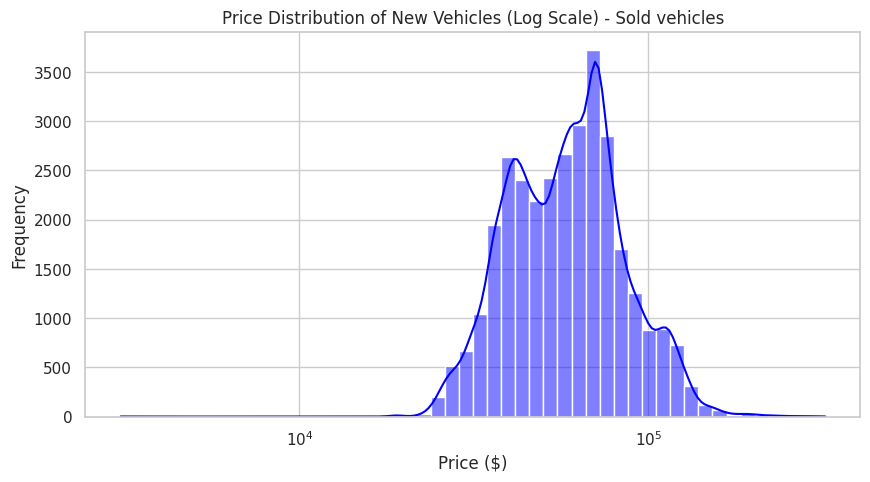

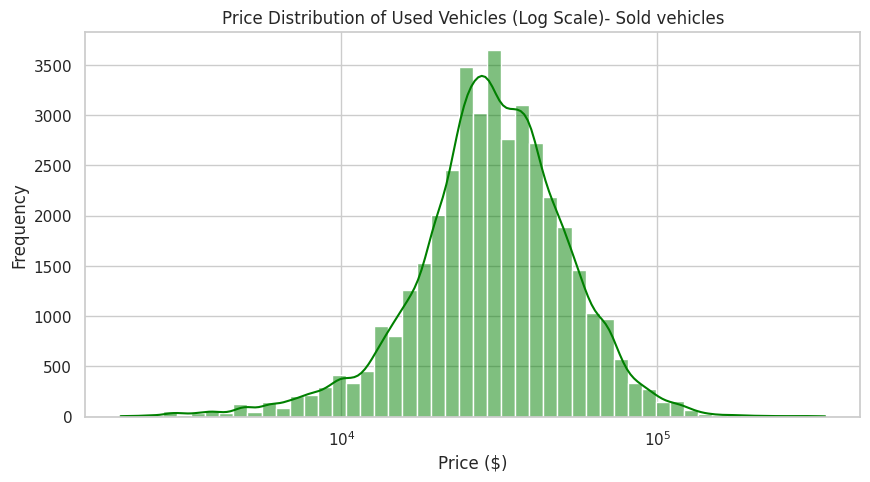

In [139]:
# Filter new and used cars
df_new = df[df["stock_type"] == "NEW"]
df_used = df[df["stock_type"] == "USED"]

# Style configuration
sns.set(style="whitegrid")

# Histogram of Price Distribution (Log Scale) - New Cars
plt.figure(figsize=(10, 5))
sns.histplot(df_new["price_imputed"], bins=50, kde=True, color="blue", log_scale=True)
plt.title("Price Distribution of New Vehicles (Log Scale) - Sold vehicles")
plt.xlabel("Price ($)")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()

# Histogram of Price Distribution (Log Scale) - Used Cars
plt.figure(figsize=(10, 5))
sns.histplot(df_used["price_imputed"], bins=50, kde=True, color="green", log_scale=True)
plt.title("Price Distribution of Used Vehicles (Log Scale)- Sold vehicles")
plt.xlabel("Price ($)")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()

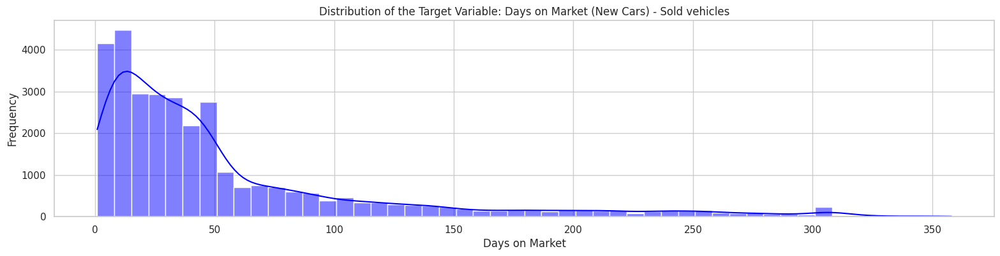

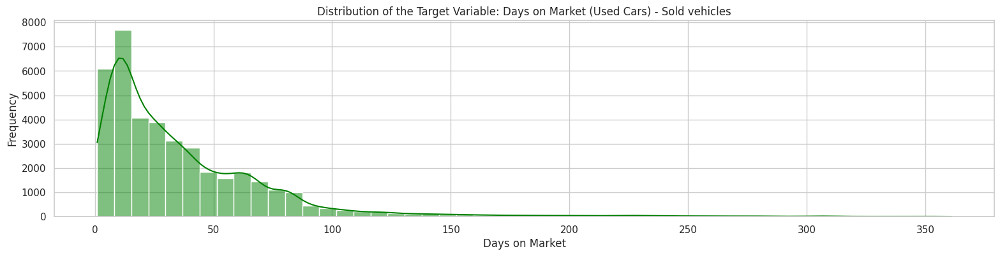

In [140]:
# Histogram of the Target Variable (days_on_market) - New Cars
plt.figure(figsize=(19, 4))
sns.histplot(df_new["days_on_market"], bins=50, kde=True, color="blue")
plt.title("Distribution of the Target Variable: Days on Market (New Cars) - Sold vehicles")
plt.xlabel("Days on Market")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()

# Histogram of the Target Variable (days_on_market) - Used Cars
plt.figure(figsize=(19, 4))
sns.histplot(df_used["days_on_market"], bins=50, kde=True, color="green")
plt.title("Distribution of the Target Variable: Days on Market (Used Cars) - Sold vehicles")
plt.xlabel("Days on Market")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()

In [141]:
# Create interactive scatter plot using Plotly
fig_year = px.scatter(
    df,
    x="model_year",
    y="price_imputed",
    color="stock_type",  # Differentiating New vs Used cars
    color_discrete_map={"NEW": "blue", "USED": "red"},
    hover_data=["price","msrp","make", "model","mileage"],
    title="Model Year vs. Price Imputed (Interactive)",
    labels={"model_year": "Model Year", "price_imputed": "Imputed Price ($) - Sold vehicles"},
    opacity=0.6
)

# Show interactive plot
fig_year.show()


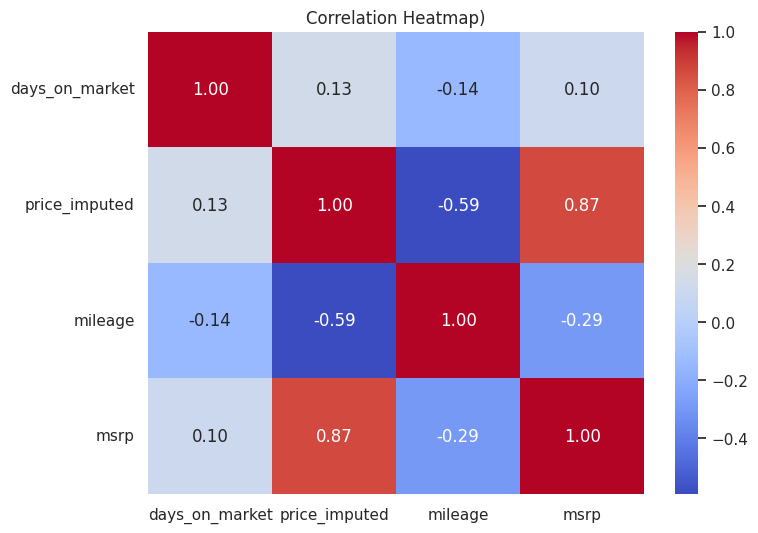

In [142]:
#Correlation Heatmap
# Filter only rows where 'listing_type' is 'Sold'
df_sold = df[df["listing_type"] == "Sold"]

# Select specific numerical columns for correlation analysis
specific_columns = ['days_on_market', 'price_imputed', 'mileage', 'msrp']

# Subset the DataFrame with these columns (only for 'Sold' cars)
subset_df = df_sold[specific_columns]

# Calculate the correlation matrix for the subset
correlation_df = subset_df.corr()

# Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_df, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap)')
plt.show()

In [143]:
#find unique drivertranin from vin
df['drivetrain_from_vin'].unique()

['FWD', 'AWD', '4WD', 'RWD']
Categories (4, object): ['4WD', 'AWD', 'FWD', 'RWD']

In [144]:
#Average days on market for sold FWD cars
# Ensure 'days_on_market' is numeric, coercing errors to NaN
df['days_on_market'] = pd.to_numeric(df['days_on_market'], errors='coerce')

# Normalize 'listing_type' and 'drivetrain_from_vin' to handle case sensitivity
df['listing_type'] = df['listing_type'].str.upper()
df['drivetrain_from_vin'] = df['drivetrain_from_vin'].str.upper()

# Filter for sold FWD cars and compute the mean days on market
days_FWD_sold_cars = df[(df['listing_type'] == 'SOLD') & (df['drivetrain_from_vin'] == 'FWD')]['days_on_market'].mean()

# Display the result
print(f"Average days on market for sold FWD cars: {days_FWD_sold_cars:.2f}")


Average days on market for sold FWD cars: 37.57


In [145]:
#Average days on market for sold 4WD cars
# Normalize 'listing_type' and 'drivetrain_from_vin' to handle case sensitivity
df['listing_type'] = df['listing_type'].str.upper()
df['drivetrain_from_vin'] = df['drivetrain_from_vin'].str.upper()

# Filter for sold FWD cars and compute the mean days on market
days_4WD_sold_cars = df[(df['listing_type'] == 'SOLD') & (df['drivetrain_from_vin'] == '4WD')]['days_on_market'].mean()

# Display the result
print(f"Average days on market for sold 4WD cars: {days_4WD_sold_cars:.2f}")

Average days on market for sold 4WD cars: 51.30


In [146]:
#Average days on market for sold AWD cars
# Normalize 'listing_type' and 'drivetrain_from_vin' to handle case sensitivity
df['listing_type'] = df['listing_type'].str.upper()
df['drivetrain_from_vin'] = df['drivetrain_from_vin'].str.upper()

# Filter for sold FWD cars and compute the mean days on market
days_AWD_sold_cars = df[(df['listing_type'] == 'SOLD') & (df['drivetrain_from_vin'] == 'AWD')]['days_on_market'].mean()

# Display the result
print(f"Average days on market for sold AWD cars: {days_AWD_sold_cars:.2f}")

Average days on market for sold AWD cars: 44.84


In [147]:
#Average days on market for sold RWD cars
# Normalize 'listing_type' and 'drivetrain_from_vin' to handle case sensitivity
df['listing_type'] = df['listing_type'].str.upper()
df['drivetrain_from_vin'] = df['drivetrain_from_vin'].str.upper()

# Filter for sold FWD cars and compute the mean days on market
days_RWD_sold_cars = df[(df['listing_type'] == 'SOLD') & (df['drivetrain_from_vin'] == 'RWD')]['days_on_market'].mean()

# Display the result
print(f"Average days on market for sold RWD cars: {days_RWD_sold_cars:.2f}")

Average days on market for sold RWD cars: 43.79


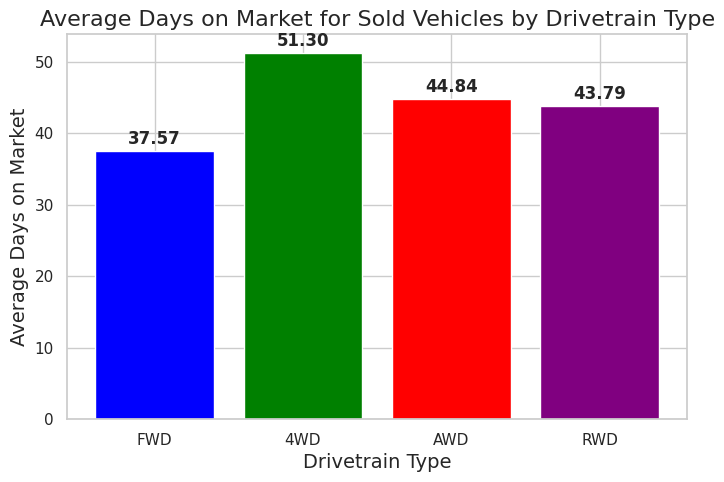

In [148]:
# Plotting bar chart Average Days on Market for Sold Vehicles by Drivetrain Type
# Correct dictionary format with key-value pairs
avg_days_on_market = {
    "FWD": days_FWD_sold_cars,
    "4WD": days_4WD_sold_cars,
    "AWD": days_AWD_sold_cars,
    "RWD": days_RWD_sold_cars
}

# Plot the bar chart
plt.figure(figsize=(8, 5))
plt.bar(avg_days_on_market.keys(), avg_days_on_market.values(), color=['blue', 'green', 'red', 'purple'])

# Add labels and title
plt.xlabel("Drivetrain Type", fontsize=14)
plt.ylabel("Average Days on Market", fontsize=14)
plt.title("Average Days on Market for Sold Vehicles by Drivetrain Type", fontsize=16)

# Show values on top of bars
for i, v in enumerate(avg_days_on_market.values()):
    plt.text(i, v + 1, f"{v:.2f}", ha='center', fontsize=12, fontweight='bold')

# Display the plot
plt.show()

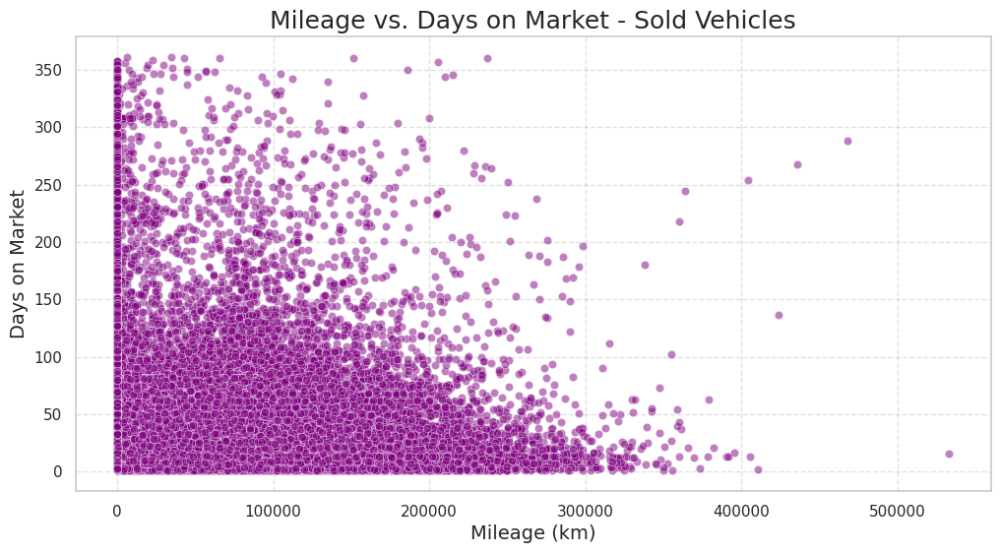

In [149]:
#Plot scatterplot of mileage by grouping model_year after handling outliers
# Set figure size
plt.figure(figsize=(12, 6))

# Filter only rows where listing_type is 'Sold'
df_sold = df[df["listing_type"] == "Sold"]
# Scatter plot: Mileage vs Days on Market
sns.scatterplot(x=df["mileage"], y=df["days_on_market"], alpha=0.5, color="purple")

# Titles and labels with larger fonts
plt.title("Mileage vs. Days on Market - Sold Vehicles", fontsize=18)  # Increase title font size
plt.xlabel("Mileage (km)", fontsize=14)  # Increase x-axis label font size
plt.ylabel("Days on Market", fontsize=14)  # Increase y-axis label font size

# Improve grid visibility
plt.grid(True, linestyle='--', alpha=0.6)

# Show plot
plt.show()

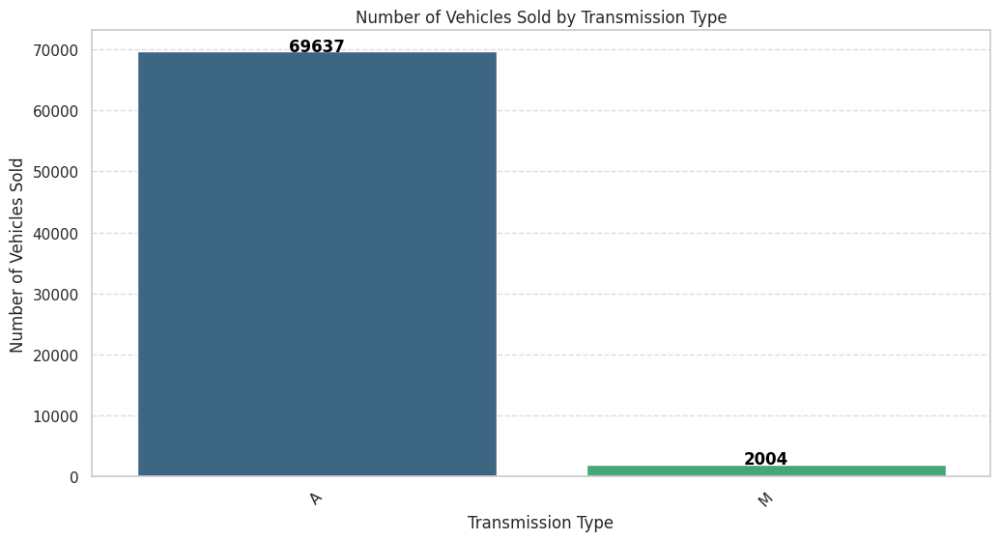

In [150]:
# Count the number of sold vehicles by transmission type
transmission_sales = df["transmission_from_vin"].value_counts().nlargest(5)

# Set figure size
plt.figure(figsize=(12, 6))

# Filter sold vehicles
df_sold = df[df["listing_type"].str.upper() == "SOLD"]

# Barplot for top transmission types
ax = sns.barplot(
    x=transmission_sales.index,
    y=transmission_sales.values,
    hue=transmission_sales.index,  # Asignar la variable x a hue
    palette="viridis",
    legend=False  # Ocultar la leyenda
)

# Add labels on top of bars
for i, v in enumerate(transmission_sales.values):
    ax.text(i, v + 50, f"{v}", ha='center', fontsize=12, fontweight='bold', color='black')

# Titles and labels
plt.title("Number of Vehicles Sold by Transmission Type")
plt.xlabel("Transmission Type")
plt.ylabel("Number of Vehicles Sold")
plt.xticks(rotation=45)
plt.grid(True, axis='y', linestyle='--', alpha=0.7)

# Show plot
plt.show()

<ipython-input-151-85e50f1ebc0c>:15: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




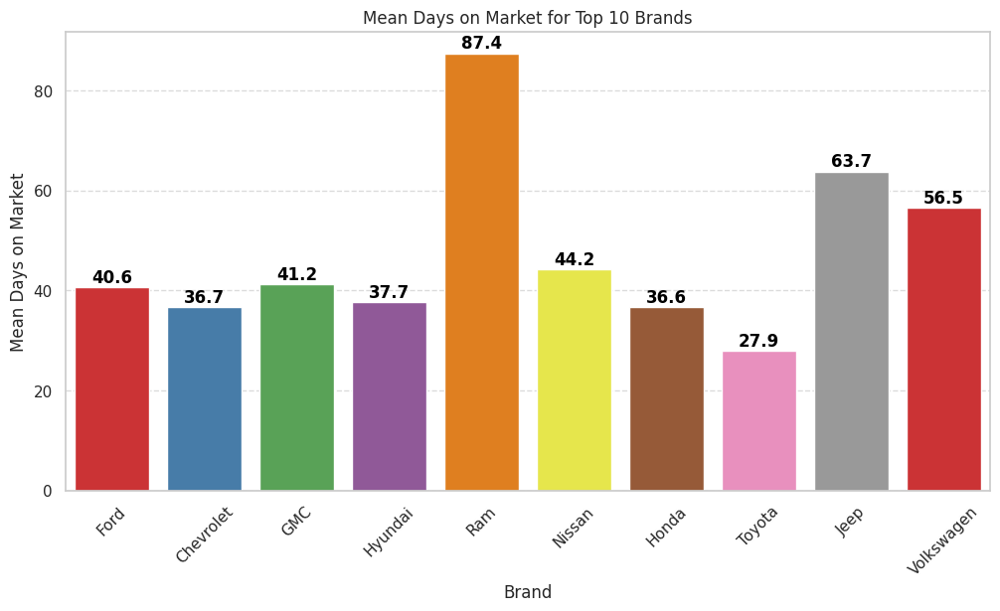

In [151]:
# Ensure 'make' is of type str (avoids unnecessary categories)
df_sold["make"] = df_sold["make"].astype(str)

# Get the 10 most common brands
top_10_brands = df_sold["make"].value_counts().nlargest(10).index

# Filter only those brands
df_top_10 = df_sold[df_sold["make"].isin(top_10_brands)]

# Calculate the mean 'days_on_market'
df_mean_days = df_top_10.groupby("make")["days_on_market"].mean().reindex(top_10_brands)

# Plot
plt.figure(figsize=(12, 6))
ax = sns.barplot(x=df_mean_days.index, y=df_mean_days.values, palette="Set1")

# Add labels with values above each bar
for i, v in enumerate(df_mean_days.values):
    ax.text(i, v + 1, f"{v:.1f}", ha='center', fontsize=12, fontweight='bold', color='black')

# Labels and title
plt.title("Mean Days on Market for Top 10 Brands")
plt.xlabel("Brand")
plt.ylabel("Mean Days on Market")
plt.xticks(rotation=45)
plt.grid(True, axis='y', linestyle='--', alpha=0.7)

# Show plot
plt.show()

<ipython-input-152-8710a4c3b87f>:9: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




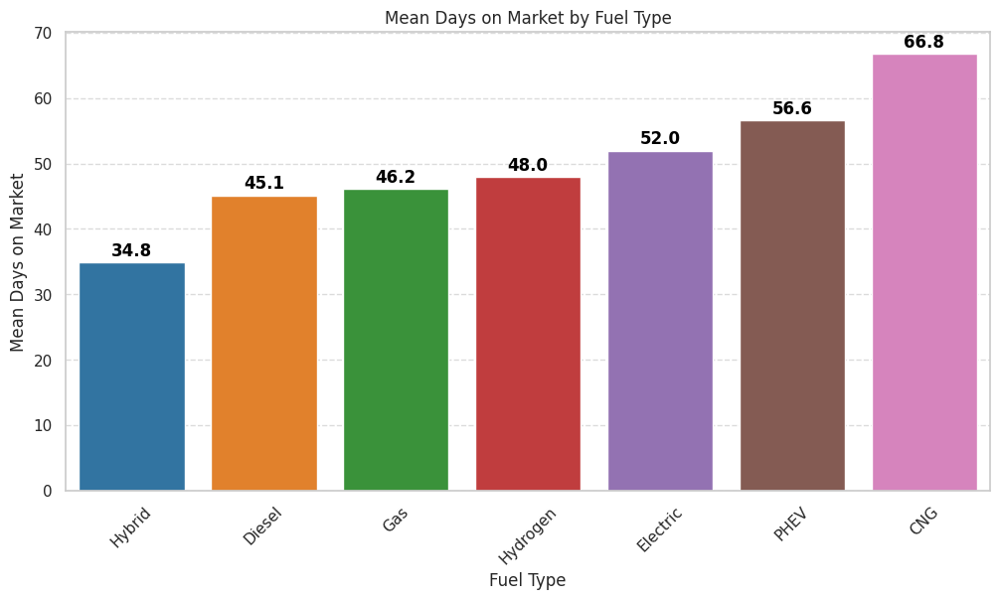

In [152]:
# Ensure 'fuel_type_from_vin' is of type str
df["fuel_type_from_vin"] = df["fuel_type_from_vin"].astype(str)

# Calculate the mean "days_on_market" by fuel type
df_fuel_type_mean_days = df.groupby("fuel_type_from_vin")["days_on_market"].mean().sort_values()

# Plot
plt.figure(figsize=(12, 6))
ax = sns.barplot(x=df_fuel_type_mean_days.index, y=df_fuel_type_mean_days.values, palette="tab10")

# Add labels with values above each bar
for i, v in enumerate(df_fuel_type_mean_days.values):
    ax.text(i, v + 1, f"{v:.1f}", ha='center', fontsize=12, fontweight='bold', color='black')

# Labels and title
plt.title("Mean Days on Market by Fuel Type")
plt.xlabel("Fuel Type")
plt.ylabel("Mean Days on Market")
plt.xticks(rotation=45)
plt.grid(True, axis='y', linestyle='--', alpha=0.7)

# Show plot
plt.show()

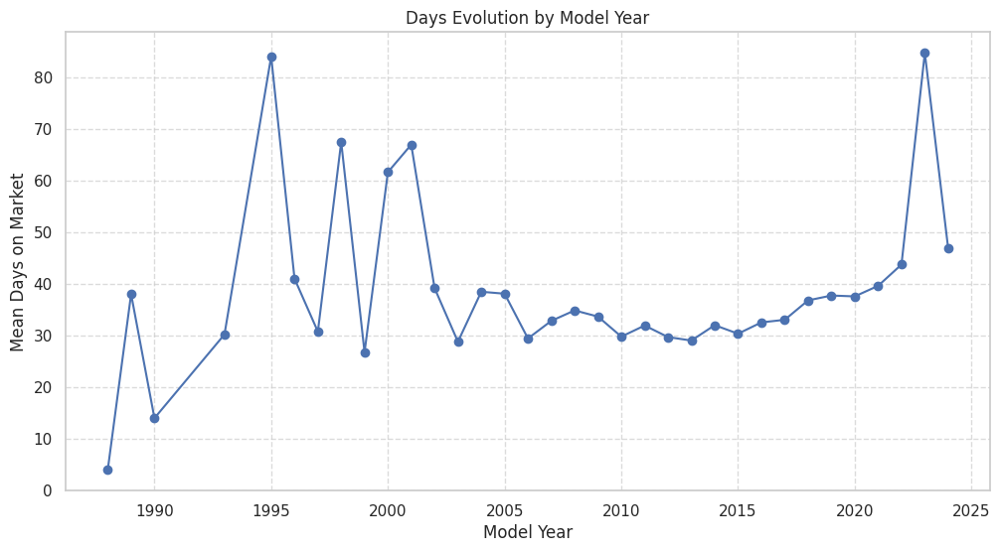

In [153]:
# Ensure 'model_year' is of numeric type
df["model_year"] = pd.to_numeric(df["model_year"], errors='coerce')

# Calculate the mean "days_on_market" by model year
df_year_mean_days = df.groupby("model_year")["days_on_market"].mean().sort_index()

# Plot
plt.figure(figsize=(12, 6))
plt.plot(df_year_mean_days.index, df_year_mean_days.values, marker='o', linestyle='-', color='b')

# Labels and title
plt.title("Days Evolution by Model Year")
plt.xlabel("Model Year")
plt.ylabel("Mean Days on Market")
plt.grid(True, linestyle='--', alpha=0.7)

# Show plot
plt.show()

## 8. Split the dataframe Training and Validation

In [334]:
# Loading the modules required
from sklearn.model_selection import train_test_split

Feature Selection

In [335]:
df_filtered = df[['dealer_city', 'stock_type', 'mileage', 'msrp', 'model_year',
       'make', 'model','series', 'exterior_color_category',
       'interior_color_category', 'wheelbase_from_vin',
       'drivetrain_from_vin', 'transmission_from_vin',
       'fuel_type_from_vin', 'number_price_changes',
       'price_imputed', 'segment']].copy()

In [336]:
X = df_filtered.copy()

In [337]:
X_new = df_filtered.loc[df_filtered['stock_type']=='NEW'].copy()

In [338]:
X_used = df_filtered.loc[df_filtered['stock_type']=='USED'].copy()

In [339]:
y = df['days_on_market'].copy()

In [340]:
y_new = df.loc[df['stock_type']=='NEW']['days_on_market'].copy()

In [341]:
y_used = df.loc[df['stock_type']=='USED']['days_on_market'].copy()

In [342]:
X_new.drop(columns=['stock_type'], inplace=True)

In [343]:
X_new.head()

,dealer_city,mileage,msrp,model_year,make,model,series,exterior_color_category,interior_color_category,wheelbase_from_vin,drivetrain_from_vin,transmission_from_vin,fuel_type_from_vin,number_price_changes,price_imputed,segment
41,Edmonton,10.0,44350,2024,Acura,Integra,Elite A-Spec,gray,red,2736.0,FWD,A,Gas,1,48545.0,Luxury
43,Edmonton,0.0,44350,2024,Acura,Integra,Elite A-Spec,white,black,2736.0,FWD,A,Gas,0,47545.0,Luxury
47,Edmonton,5.0,44350,2024,Acura,Integra,Elite A-Spec,black,red,2736.0,FWD,A,Gas,0,48545.0,Luxury
48,Edmonton,20.0,44350,2024,Acura,Integra,Elite A-Spec,red,black,2736.0,FWD,A,Gas,0,48545.0,Luxury
51,Edmonton,0.0,55600,2024,Acura,Integra,Type S,white,black,2736.0,FWD,M,Gas,0,58795.0,Luxury


In [344]:
X_used.drop(columns=['stock_type'], inplace=True)

In [345]:
X_used.head()

,dealer_city,mileage,msrp,model_year,make,model,series,exterior_color_category,interior_color_category,wheelbase_from_vin,drivetrain_from_vin,transmission_from_vin,fuel_type_from_vin,number_price_changes,price_imputed,segment
1,Sherwood Park,67870.0,33490,2016,Acura,ILX,Tech,white,black,2670.0,FWD,A,Gas,0,18995.0,Luxury
2,Edmonton,104842.0,32290,2017,Acura,ILX,Premium,white,black,2670.0,FWD,A,Gas,0,19999.0,Luxury
3,Edmonton,85119.0,32290,2018,Acura,ILX,Premium,white,black,2670.0,FWD,A,Gas,0,23995.0,Luxury
7,Edmonton,69268.0,32490,2019,Acura,ILX,Premium,white,black,2670.0,FWD,A,Gas,2,24963.0,Luxury
10,Edmonton,113068.0,32290,2018,Acura,ILX,Premium,black,black,2670.0,FWD,A,Gas,0,23949.0,Luxury


Dataset model 1 - all used and used vehicles

In [346]:
# Splitting the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

Dataset model 2 - New vehicles

In [347]:
# Splitting the dataset into training and testing sets
X_new_train, X_new_test, y_new_train, y_new_test = train_test_split(X_new, y_new, test_size=0.2)

Dataset model 3 - Used vehicles

In [348]:
# Splitting the dataset into training and testing sets
X_used_train, X_used_test, y_used_train, y_used_test = train_test_split(X_used, y_used, test_size=0.2)

## 9. Encoding

### 9.1 Model 1 - New and Used vehicles

In [349]:
X_train.dtypes

,0
dealer_city,category
stock_type,category
mileage,float64
msrp,int64
model_year,int64
make,category
model,category
series,category
exterior_color_category,category
interior_color_category,category


We will use target encoding on columns with high cardinality in order to reduce dimensionality while preserving relationships.

Columns to use target encoding:
* make
* model
* series
* exterior_color_category
* interior_color_category

In [350]:
def target_encode_columns(X_train, X_test, y_train, columns):
    # Function to apply target encoding to multiple categorical variables

    # Create copies to avoid modifying original
    X_train_encoded = X_train.copy()
    X_test_encoded = X_test.copy()

    for col in columns:
        # Calculate mean of the target for each category
        mean_encoding = y_train.groupby(X_train[col], observed=True).mean()  # observed=True

        # Apply mean encoding to train and test data
        X_train_encoded[col] = X_train[col].map(mean_encoding)
        X_test_encoded[col] = X_test[col].map(mean_encoding)

        # Handle unseen categories
        global_mean = y_train.mean()
        X_test_encoded[col] = X_test_encoded[col].fillna(global_mean)

    return X_train_encoded, X_test_encoded

In [351]:
categorical_columns = ['make', 'model', 'series',
                       'exterior_color_category', 'interior_color_category']

X_train_encoded, X_test_encoded = target_encode_columns(X_train, X_test, y_train, categorical_columns)

We will use label encoding on columns with low cardinality for simplicity and efficiency.

Columns to use label encoding:
* stock_type
* drivetrain_from_vin
* transmission_from_vin
* fuel_type_from_vin
* segment

In [352]:
from sklearn.preprocessing import LabelEncoder

def label_encode_columns(X_train, X_test, columns):
  # Function to apply label encoding to multiple categorical variables

  label_encoder = LabelEncoder()

  for col in columns:
    # Fit encoder on training data and transform both training and test data
    X_train[col] = label_encoder.fit_transform(X_train[col])
    X_test[col] = label_encoder.transform(X_test[col])

  return X_train, X_test

In [361]:
categorical_columns = ['stock_type', 'drivetrain_from_vin', 'transmission_from_vin',
                       'fuel_type_from_vin', 'segment', 'dealer_city']

X_train_encoded, X_test_encoded = label_encode_columns(X_train_encoded, X_test_encoded, categorical_columns)

In [362]:
X_train_encoded.head()

,dealer_city,stock_type,mileage,msrp,model_year,make,model,series,exterior_color_category,interior_color_category,wheelbase_from_vin,drivetrain_from_vin,transmission_from_vin,fuel_type_from_vin,number_price_changes,price_imputed,segment
35999,2,1,160436.0,109085,2018,45.232274,45.521505,46.625674,48.184781,45.858998,2946.0,1,0,3,2,53695.0,1
58248,2,1,61599.0,55775,2018,36.666731,40.037966,31.519435,45.453694,45.858998,3645.0,0,0,3,6,73740.0,0
106057,2,1,108915.0,39500,2017,48.726872,45.738854,45.022727,48.184781,45.858998,2670.0,1,0,3,6,21907.0,1
603,2,1,61000.0,38345,2018,63.273743,40.425000,92.792453,45.453694,45.858998,2423.0,0,0,3,3,30910.0,0
34463,2,0,2.0,87599,2024,41.310389,41.144912,42.259102,47.472542,45.858998,3988.0,0,0,3,0,92614.0,0


### 9.2 Model 2 - New vehicles

In [355]:
categorical_columns = ['make', 'model', 'series',
                       'exterior_color_category', 'interior_color_category']

X_new_train_encoded, X_new_test_encoded = target_encode_columns(X_new_train, X_new_test, y_new_train, categorical_columns)

In [363]:
categorical_columns = ['drivetrain_from_vin', 'transmission_from_vin',
                       'fuel_type_from_vin', 'segment', 'dealer_city']

X_new_train_encoded, X_new_test_encoded = label_encode_columns(X_new_train_encoded, X_new_test_encoded, categorical_columns)

In [364]:
X_new_train_encoded.head()

,dealer_city,mileage,msrp,model_year,make,model,series,exterior_color_category,interior_color_category,wheelbase_from_vin,drivetrain_from_vin,transmission_from_vin,fuel_type_from_vin,number_price_changes,price_imputed,segment
87048,5,10.0,55350,2024,61.235835,58.971429,37.583333,47.318182,56.045677,3120.0,1,0,2,0,58270.0,0
60434,1,0.0,52249,2024,38.324304,41.204301,40.038961,52.798171,56.045677,2863.0,1,0,2,0,58439.0,0
38256,1,10.0,54495,2024,72.222140,69.971963,53.183333,52.798171,56.045677,2980.0,1,0,2,1,58170.0,0
99278,2,10.0,35795,2024,50.387228,54.274194,52.337662,61.947421,56.045677,2630.0,1,0,2,2,39995.0,0
18944,1,71.0,75100,2023,44.649610,42.677419,56.006711,52.798171,56.045677,3750.0,3,0,1,5,69539.5,0


### 9.3 Model 3 - Used vehicles

In [365]:
categorical_columns = ['make', 'model', 'series',
                       'exterior_color_category', 'interior_color_category']

X_used_train_encoded, X_used_test_encoded = target_encode_columns(X_used_train, X_used_test, y_used_train, categorical_columns)

In [366]:
categorical_columns = ['drivetrain_from_vin', 'transmission_from_vin',
                       'fuel_type_from_vin', 'segment', 'dealer_city']

X_used_train_encoded, X_used_test_encoded = label_encode_columns(X_used_train_encoded, X_used_test_encoded, categorical_columns)

In [367]:
X_new_train_encoded.head()

,dealer_city,mileage,msrp,model_year,make,model,series,exterior_color_category,interior_color_category,wheelbase_from_vin,drivetrain_from_vin,transmission_from_vin,fuel_type_from_vin,number_price_changes,price_imputed,segment
87048,5,10.0,55350,2024,61.235835,58.971429,37.583333,47.318182,56.045677,3120.0,1,0,2,0,58270.0,0
60434,1,0.0,52249,2024,38.324304,41.204301,40.038961,52.798171,56.045677,2863.0,1,0,2,0,58439.0,0
38256,1,10.0,54495,2024,72.222140,69.971963,53.183333,52.798171,56.045677,2980.0,1,0,2,1,58170.0,0
99278,2,10.0,35795,2024,50.387228,54.274194,52.337662,61.947421,56.045677,2630.0,1,0,2,2,39995.0,0
18944,1,71.0,75100,2023,44.649610,42.677419,56.006711,52.798171,56.045677,3750.0,3,0,1,5,69539.5,0


# 10. CSV Generation

In [368]:
df_train = pd.concat([X_train_encoded, y_train], axis=1)
df_test = pd.concat([X_test_encoded, y_test], axis=1)

In [369]:
df_new_train = pd.concat([X_new_train_encoded, y_new_train], axis=1)
df_new_test = pd.concat([X_new_test_encoded, y_new_test], axis=1)

In [370]:
df_used_train = pd.concat([X_used_train_encoded, y_used_train], axis=1)
df_used_test = pd.concat([X_used_test_encoded, y_used_test], axis=1)

In [372]:
df_train.to_csv('Go_auto_train_data.csv', index=False)
df_test.to_csv('Go_auto_test_data.csv', index=False)
df_new_train.to_csv('Go_auto_new_train_data.csv', index=False)
df_new_test.to_csv('Go_auto_new_test_data.csv', index=False)
df_used_train.to_csv('Go_auto_used_train_data.csv', index=False)
df_used_test.to_csv('Go_auto_used_test_data.csv', index=False)

# Download the cleaned files
files.download('Go_auto_train_data.csv')
files.download('Go_auto_test_data.csv')
files.download('Go_auto_new_train_data.csv')
files.download('Go_auto_new_test_data.csv')
files.download('Go_auto_used_train_data.csv')
files.download('Go_auto_used_test_data.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>